Author: Dan Shea  
Date: 2019.10.31  
#### Exploratory plotting of TPM data

In [1]:
import plotly.express as px
import pandas as pd
import numpy as np
import pathlib as pl
import re
from collections import OrderedDict

In [2]:
samples = ['24h_2012', '24h_DDW', '24h_TH68', '48h_2012', '48h_DDW', '48h_TH68', 'AM', 'C_leaf', 'EM', 'F_leaf',
           'Flagleaf', 'H_leaf', 'N_embryo', 'N_leaf', 'N_leafsheath', 'N_root', 'RT', 'S_YoungPanicle', 'YL', 'YP13',
           'YP36', 'YP610', 'YP_Booting', 'YoungPanicle',]

In [3]:
basedir = pl.Path('/dsu1/Research/Hitomebore_Expression_Data/analysis/hisat2_aligned')

In [4]:
abundance_dict = OrderedDict()
abundance_files = sorted(list(basedir.rglob('*/*.tab')))
for s, pp in zip([str(p) for p in abundance_files], abundance_files):
    key = s.split('/')[6]
    if key in abundance_dict:
        abundance_dict[key].append(pp)
    else:
        abundance_dict[key] = [pp]

In [5]:
# Checking the population sizes
[(k, len(abundance_dict[k])) for k in abundance_dict]

[('24h_2012', 3),
 ('24h_DDW', 3),
 ('24h_TH68', 3),
 ('48h_2012', 3),
 ('48h_DDW', 3),
 ('48h_TH68', 3),
 ('AM', 2),
 ('C_leaf', 3),
 ('EM', 3),
 ('F_leaf', 3),
 ('Flagleaf', 3),
 ('H_leaf', 3),
 ('N_embryo', 3),
 ('N_leaf', 3),
 ('N_leafsheath', 3),
 ('N_root', 3),
 ('RT', 2),
 ('S_YoungPanicle', 3),
 ('YL', 2),
 ('YP13', 2),
 ('YP36', 5),
 ('YP610', 4),
 ('YP_Booting', 3),
 ('YoungPanicle', 3)]

In [6]:
tpm_data = OrderedDict()
for sample in abundance_dict:
    tpm_data[sample] = pd.read_csv(abundance_dict[sample][0], sep='\t')
    for i in abundance_dict[sample][1:]:
        tpm_data[sample] = pd.concat([tpm_data[sample], pd.read_csv(i, sep='\t')])
    tpm_data[sample].reset_index(drop=True, inplace=True)

In [7]:
tpm_agg = {sample: tpm_data[sample].groupby('Gene ID')['TPM'].agg(['mean', 'sem']) for sample in tpm_data}

In [8]:
# Re-order the index (Gene ID) based on numerical order
# Here we pass as the sort key the Gene ID without the G prefix so that the sort is conducted numerically
for sample in tpm_agg:
    tpm_agg[sample] = tpm_agg[sample].reindex(sorted(tpm_agg[sample].index, key=lambda x: int(x.strip('G'))))

In [9]:
# plotly needs the index to be a column and not an index, so we reset_index and this will copy the existing index as a column into the dataframe
for sample in tpm_agg:
    tpm_agg[sample].reset_index(inplace=True)

In [10]:
tpm_agg['24h_2012']

,Gene ID,mean,sem
0,G1,0.000000,0.000000
1,G2,17.100440,1.297837
2,G3,138.980448,2.525849
3,G4,285.137319,11.281481
4,G5,449.999878,16.504875
...,...,...,...
33023,G33024,37.645542,0.341031
33024,G33025,11.037594,1.469545
33025,G33026,3.398033,0.424914
33026,G33027,6.378966,0.723127


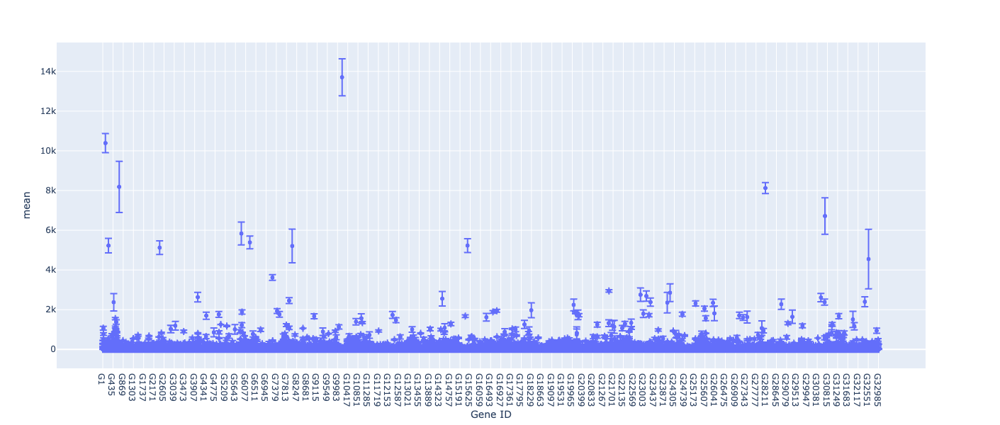

In [11]:
fig = px.scatter(tpm_agg['24h_2012'], x="Gene ID", y="mean", error_y="sem")
fig.show()

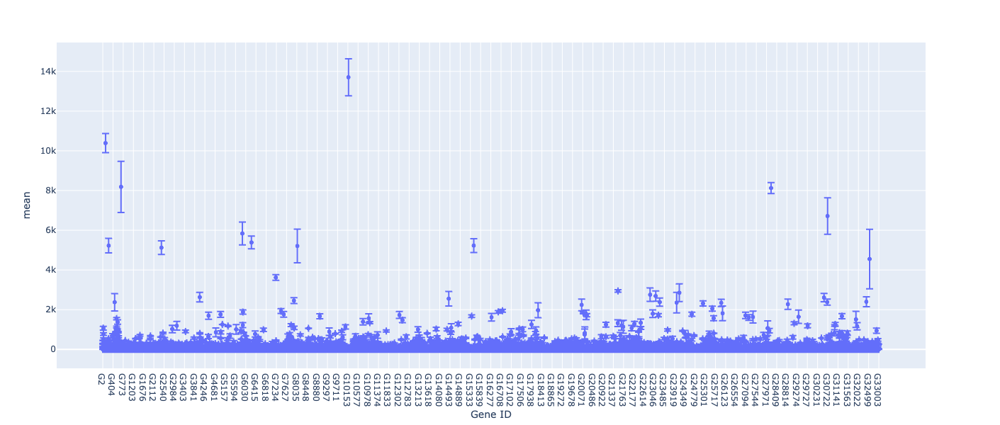

In [12]:
# Remove genes where the mean expression is zero
fig = px.scatter(tpm_agg['24h_2012'].loc[tpm_agg['24h_2012']['mean'] != 0, :], x="Gene ID", y="mean", error_y="sem")
fig.show()

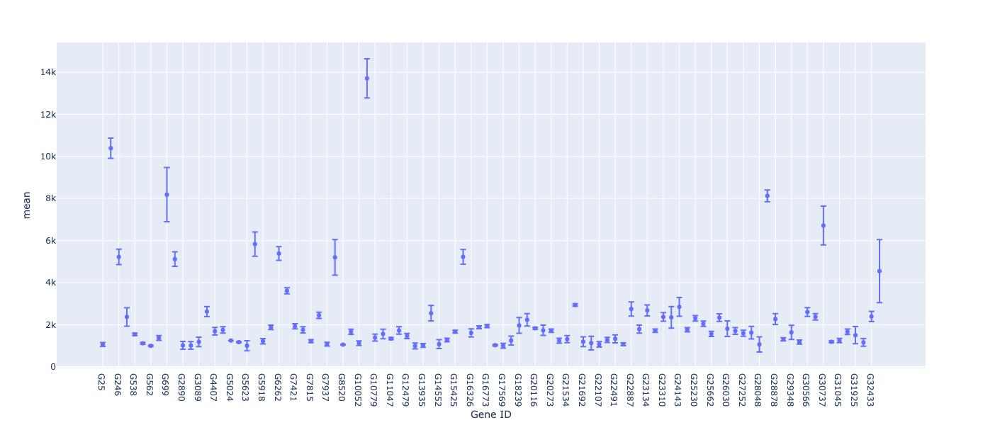

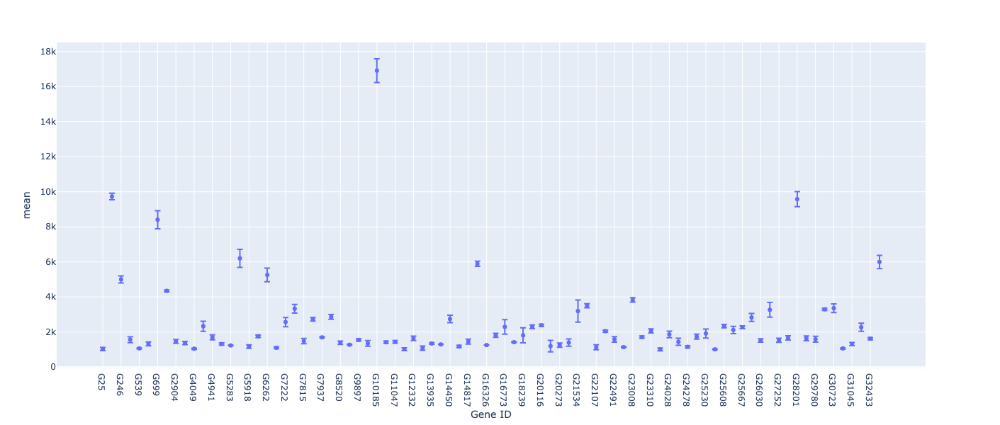

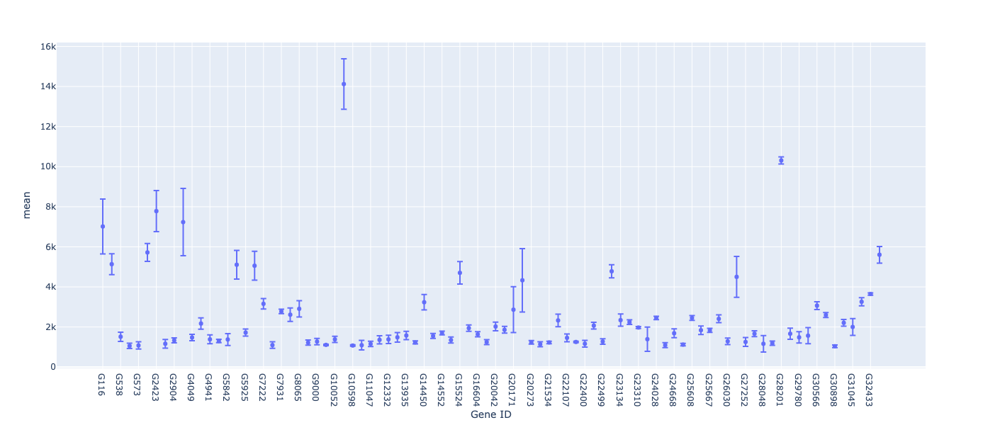

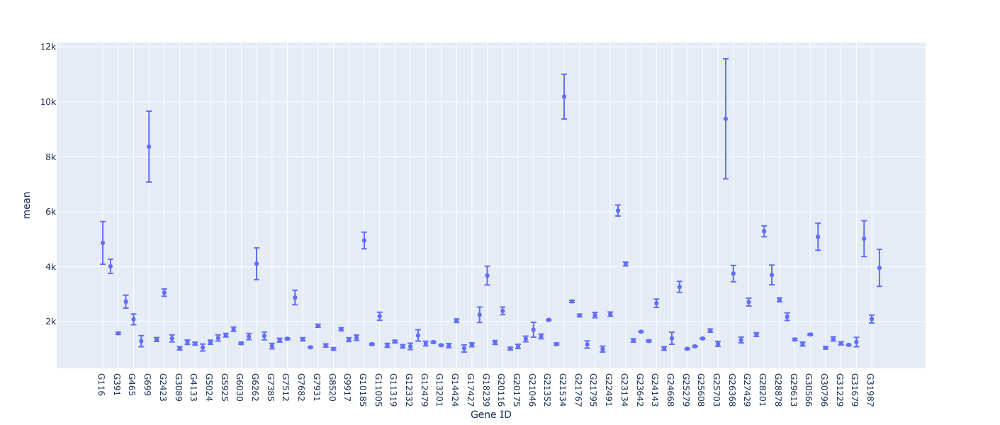

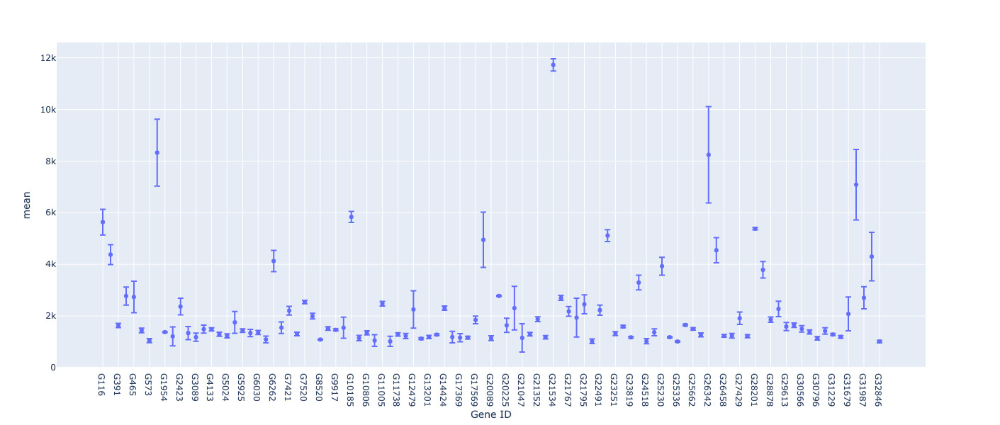

...

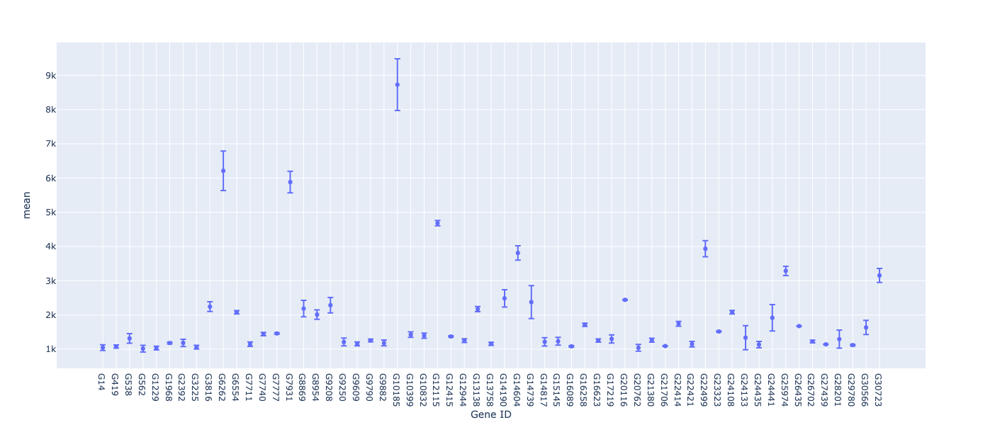

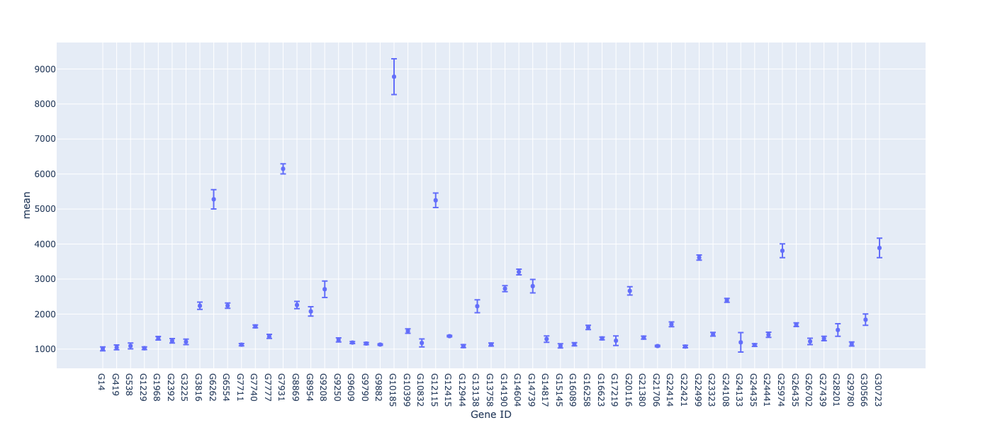

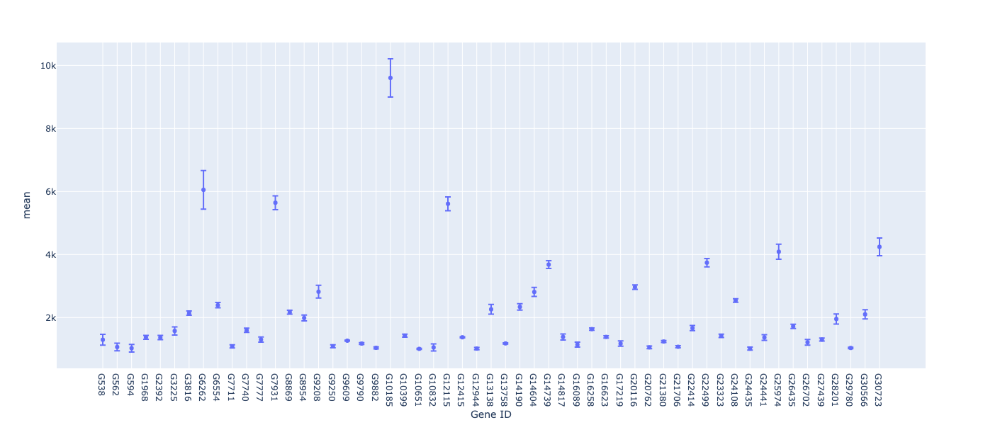

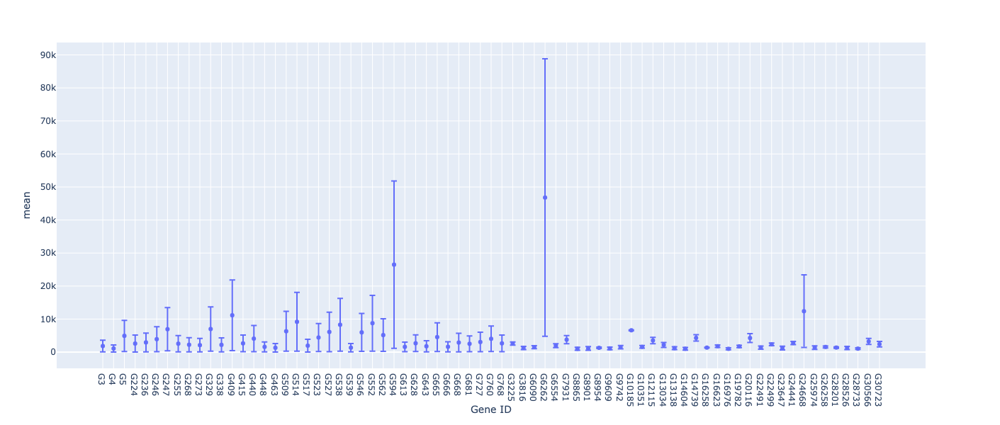

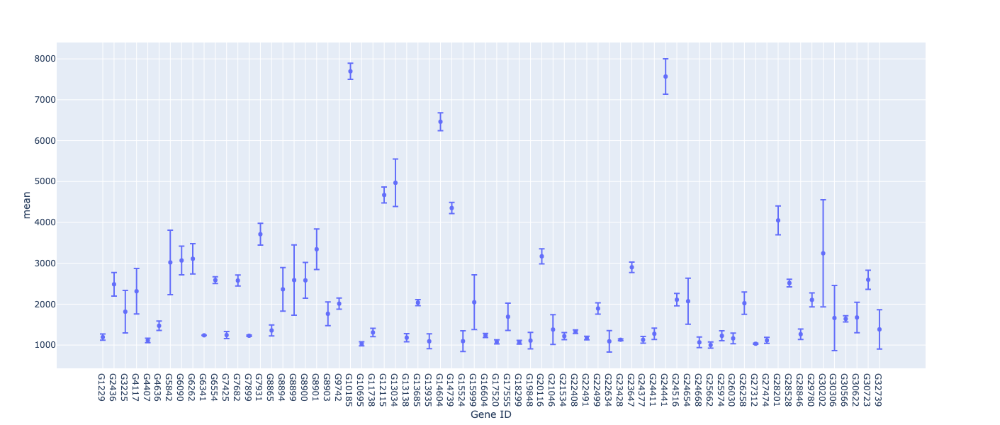

In [13]:
# Plot the data for every sample to a pdf file
TPM_FLOOR = 1000
for sample in tpm_agg:
    tmp_df = tpm_agg[sample].loc[tpm_agg[sample]['mean'] >= TPM_FLOOR, :]
    fig = px.scatter(tmp_df, x="Gene ID", y="mean", error_y="sem")
    fig.show()